# SKYE 

Analyzing 360-degree images for ecological analysis with python.

This notebook provides examples of some of the current supported features and functions.

In [1]:
from skye.core import SkyViewClassified, SkyViewThreshold

from matplotlib import pyplot as plt
%matplotlib inline  

`skye.core` will create hemispherical photos, classified sky vs non-sky classified images, and the sky-view-factor from 360-degree RGB images. 

There are currently two supported methods two create these objects. The first, `SkyViewThreshold` uses a threshold value to create binary sky non-sky images while the second, `SkyViewClassified` uses the quickshift segmentation alrogithm to create superpixels which can then be classified using machine learning methods.

## Sky View Classified

First, let's create and analyze images using computer vision and image classification. We will create a `SkyViewClassified` object using a 360 image taken from a Ricoh Theta S and some predefined training data. See the training data section below for how to create training data.

In [2]:
skye = SkyViewClassified('R0012437.JPG', training_data_path='training.csv')

Creating Hemispherical Photo:   0%|          

Creating Objects:   0%|          

Creating object statistics dataframe:   0%|          

Now that the object has been created, we can simply extract all that we need. First we can observe the hemispherical image:

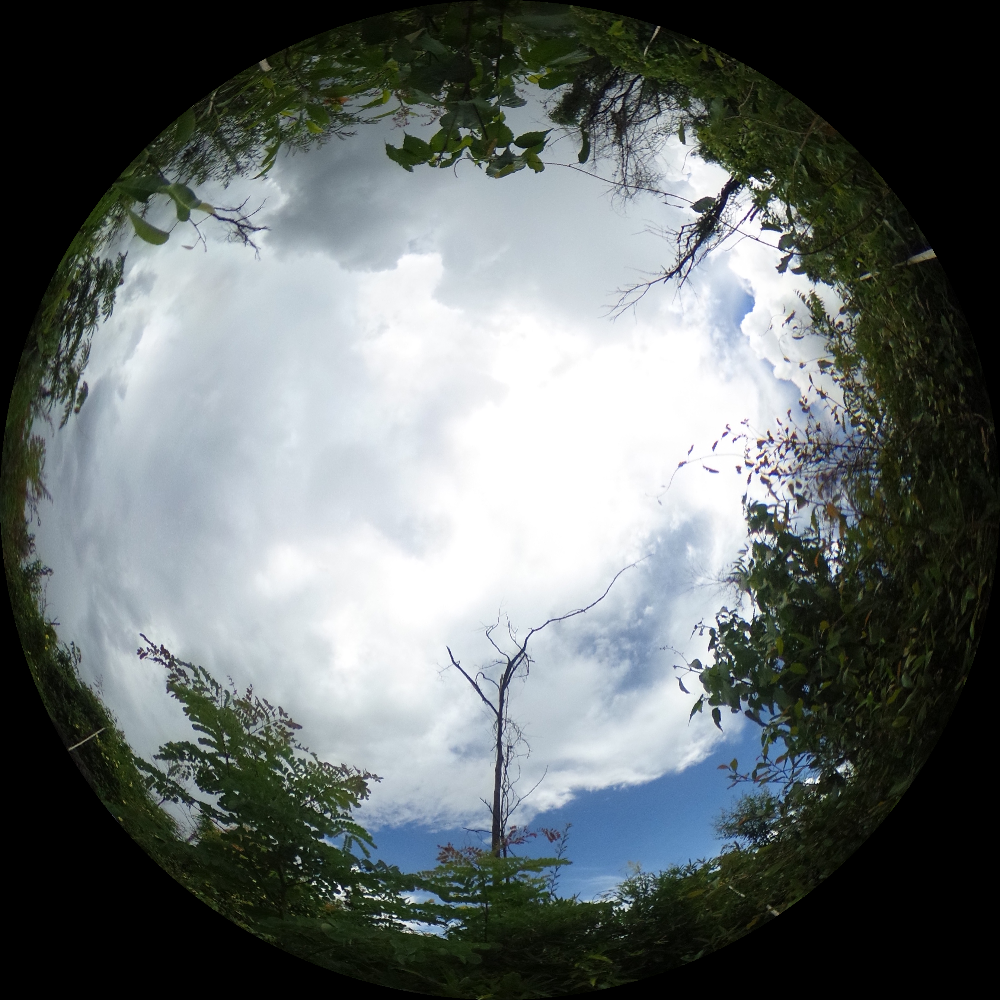

In [11]:
skye.img

Since `SkyViewClassified` class uses image segmentation and classification, it is possible to view the resulting segmented image as well as the statistics associated with each segment. These are crucial for the image classification that was used to create the binary sky image. Note, currently parameters to control the tuning of these models are not exposed during this experimental phase of the library.

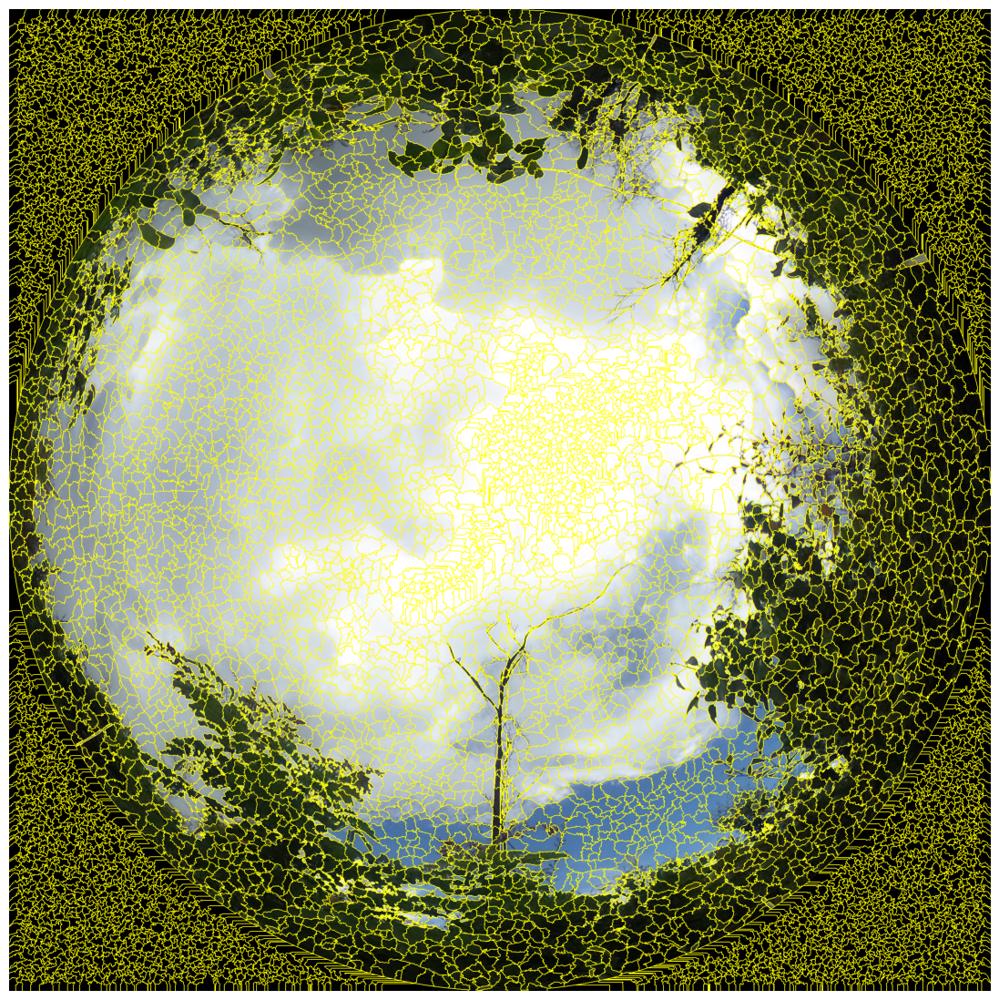

In [4]:
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(1, 1, 1)
plt.axis("off")

skye.plot_segments(ax)
plt.show()

And the resulting classified image:

In [14]:
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(1, 1, 1)
plt.axis("off")

skye.plot_classified(ax)
plt.show()

TypeError: unsupported operand type(s) for *: 'Image' and 'int'

Finally, we can extract the sky view factor (canopy openness):

In [6]:
skye.sky_view_factor * 255

0.5981438776303035

## Sky View Threshold

We can also observe the quality of binary sky images that are generated using a threshold on greyscale images. For this analysis, it is important to set the best threshold value.

In [7]:
skye_thresh = SkyViewThreshold('R0012437.JPG', threshold=0.7)

Creating Hemispherical Photo:   0%|          

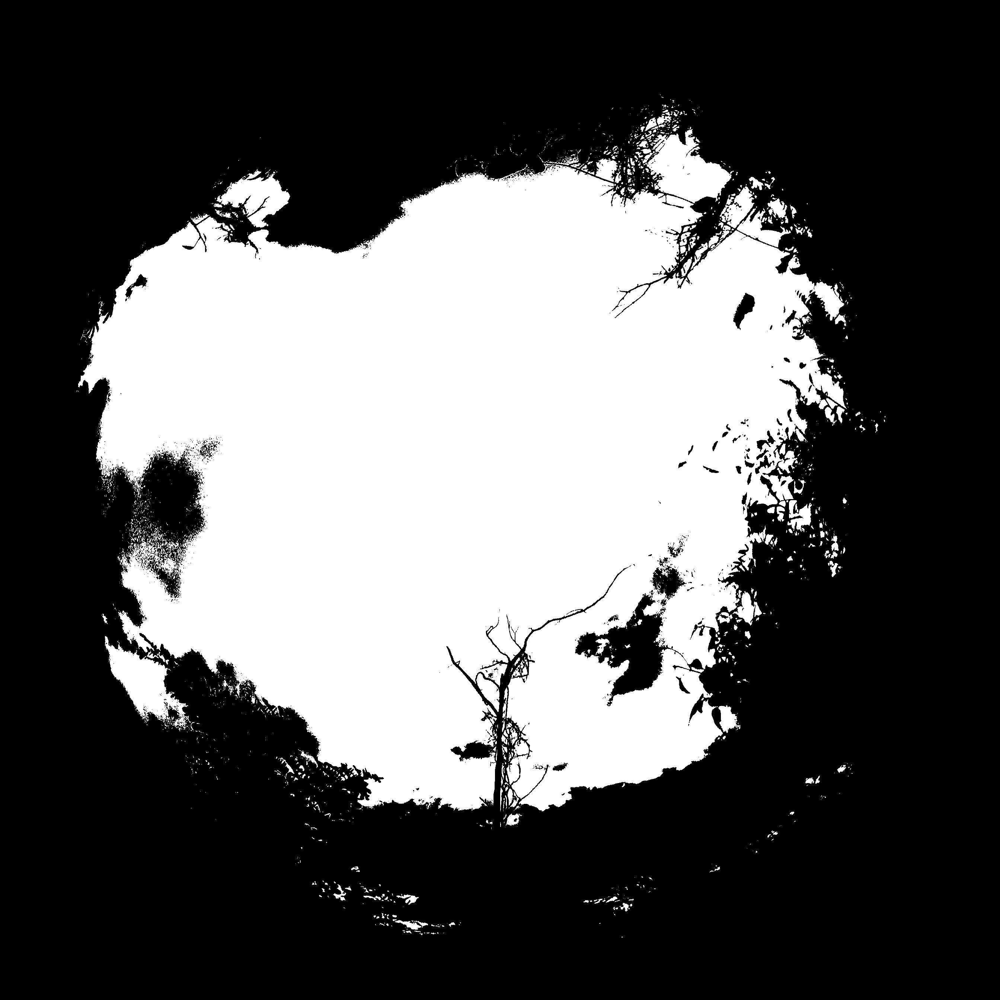

In [8]:
skye_thresh.binary_img

In [9]:
skye_thresh.sky_view_factor

0.44216554417123644

## Creating training data for Sky View Classified

Finally, we can create training data for the classification algorithm using in `SkyViewClass`. 

working on segment 7939.0 (0/500)


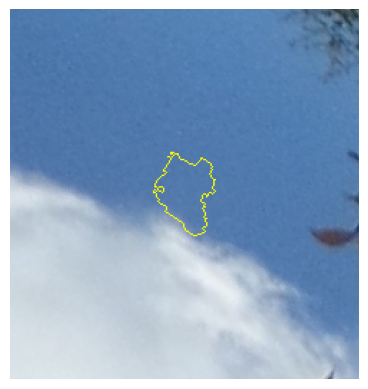

KeyboardInterrupt: Interrupted by user

In [10]:
skye.create_training_data(n_samples=1000, notebook=True)

In [ ]:
skye.export_training_data('training_data_expanded.csv')